# Search Algorithms on a Real Gym Environment

This notebook solves **FrozenLake-v1** (from [Gymnasium](https://gymnasium.farama.org)) using classical search — BFS, DFS, Uniform-Cost Search, and A\* — instead of reinforcement learning.

It pairs with the in-chat interactive maze widget from lecture: same four algorithms, same idea, but here they run against a real Gym environment's actual `step()` dynamics rather than a hand-drawn grid.

Non-slippery FrozenLake is exactly the kind of environment classical search assumes: **discrete, fully observable, deterministic, static, and known**. Near the end, we flip `is_slippery=True` and watch that guarantee collapse — a concrete illustration of why the course's roadmap moves toward MDPs and reinforcement learning once the environment stops being deterministic.

In [1]:
# If gymnasium isn't installed in your environment, uncomment the next line:
# !pip install gymnasium

import gymnasium as gym
import numpy as np
import heapq
from collections import deque
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

## 1. Create the environment

**`obs, info = env.reset(seed=0)`**
Resets the environment to a fresh initial state and starts a new episode. Returns:
- `obs` — the first observation/percept the agent sees (in your Lecture 2 vocabulary: this *is* the percept, since `reset()` is the moment the agent-environment loop begins)
- `info` — a dict of extra diagnostic data that isn't part of the official observation (varies by environment; FrozenLake's is mostly empty, some environments put debug info here)

`seed=0` makes the reset reproducible.

You must call `reset()` before the first `step()` — an environment has no valid state to act in until it's been initialized.

**`obs, reward, terminated, truncated, info = env.step(action)`**
The actual agent-environment exchange: the agent hands the environment an `action`, the environment advances one timestep and hands back five things:
- `obs` — the new percept after the action
- `reward` — the scalar reward for that transition (this is your performance-measure signal, delivered incrementally rather than all at once)
- `terminated` — `True` if the episode ended because of the environment's own dynamics: goal reached, or failure (fell in a FrozenLake hole)
- `truncated` — `True` if an external limit cut the episode short (step count, time limit) — nothing to do with success or failure, just "we stopped watching"
- `info` — same diagnostic-dict role as above

This is the one line that gets called over and over, once per timestep, until `terminated or truncated` is `True`.

**`env.render()`**
Produces a visual (or textual) representation of the current state, in whatever format you asked for via `render_mode` when you called `gym.make(...)`:
- `render_mode="human"` → opens a live window, `render()` draws to it and returns `None`
- `render_mode="rgb_array"` → `render()` returns a NumPy image array instead of opening a window — this is what FrozenLake notebook uses to build the `matplotlib` animation frames
- `render_mode="ansi"` → returns a text/string representation

Nothing in `render()` affects the environment's actual state or dynamics — it's purely observational, a side channel for humans (or your recording pipeline), never part of what the agent perceives via `step()`.

**`env.close()`**
Releases whatever resources the environment opened — a rendering window, a connected simulator process, file handles for video recording. For something as lightweight as FrozenLake this barely matters, but it's the environment-cleanup equivalent of closing a file: cheap to always do, occasionally important (rendering windows that don't release cleanly, simulator environments that hold real OS resources), and good habit to build now before students hit an environment where skipping it actually causes a problem.

**The pattern to use:**

```python
obs, info = env.reset(seed=0)
done = False
while not done:
    action = ...                      # the agent's decision
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
env.close()
```

That loop *is* the agent-environment diagram from Lecture 1, executed literally — `reset` initializes, `step` is one full percept→action→consequence cycle, and the loop ends the moment either the environment or the experimenter says stop.

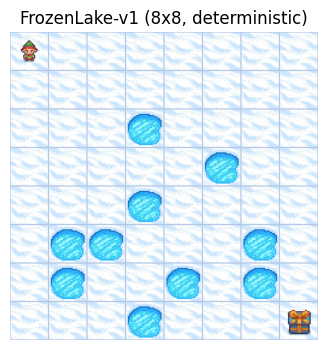

In [13]:
env = gym.make("FrozenLake-v1", map_name="8x8", is_slippery=False, render_mode="rgb_array")
obs, info = env.reset(seed=0)

nrow, ncol = env.unwrapped.nrow, env.unwrapped.ncol
desc = [[cell.decode("utf-8") for cell in row] for row in env.unwrapped.desc]

def to_rc(s): return divmod(s, ncol)
def to_s(r, c): return r * ncol + c

start_state = to_s(*[(r, c) for r in range(nrow) for c in range(ncol) if desc[r][c] == "S"][0])
goal_state  = to_s(*[(r, c) for r in range(nrow) for c in range(ncol) if desc[r][c] == "G"][0])

plt.figure(figsize=(4, 4))
plt.imshow(env.render())
plt.axis("off")
plt.title("FrozenLake-v1 (8x8, deterministic)")
plt.show()

In [3]:
env.action_space        # what the agent CAN do

Discrete(4)

In [4]:
env.observation_space   # what the agent CAN perceive

Discrete(64)

In [9]:
env.action_space.sample()      # a random valid action

np.int64(2)

In [12]:
env.action_space.contains(a)   # is `a` legal here?

## 2. Read the environment's model directly

Because this environment is **known** (in the environment-taxonomy sense from lecture), we're allowed to look directly at `env.unwrapped.desc` to build a search graph over states, rather than only calling `env.step()` blindly the way a reinforcement-learning agent has to. That's the same known-vs-unknown distinction from the taxonomy slides — classical search assumes *known*, RL is built for *unknown*.

In [14]:
# Gymnasium's FrozenLake action encoding: 0=LEFT, 1=DOWN, 2=RIGHT, 3=UP
DELTAS = {0: (0, -1), 1: (1, 0), 2: (0, 1), 3: (-1, 0)}
ACTION_NAMES = {0: "LEFT", 1: "DOWN", 2: "RIGHT", 3: "UP"}

def neighbors(s):
    r, c = to_rc(s)
    out = []
    for a, (dr, dc) in DELTAS.items():
        nr, nc = r + dr, c + dc
        if 0 <= nr < nrow and 0 <= nc < ncol and desc[nr][nc] != "H":
            out.append((a, to_s(nr, nc)))
    return out

def heuristic(s):
    r, c = to_rc(s)
    gr, gc = to_rc(goal_state)
    return abs(r - gr) + abs(c - gc)  # Manhattan distance

## 3. Generic search: BFS, DFS, UCS, A\*

One function, four algorithms — only the frontier data structure and expansion order change. `came_from` stores `(previous_state, action_taken)` so we can recover an actual sequence of Gym actions at the end, not just a sequence of states.

In [23]:
def search(algo):
    came_from = {start_state: (None, None)}
    cost_so_far = {start_state: 0}
    order = []
    visited = set()

    if algo == "bfs":
        frontier = deque([start_state])
    elif algo == "dfs":
        frontier = [start_state]
    else:
        frontier = [(0, 0, start_state)]  # (priority, tiebreak, state)
        counter = 0

    while frontier:
        if algo == "bfs":
            s = frontier.popleft()
        elif algo == "dfs":
            s = frontier.pop()
        else:
            _, _, s = heapq.heappop(frontier)

        if s in visited:
            continue
        visited.add(s)
        order.append(s)
        if s == goal_state:
            break

        for a, ns in neighbors(s):
            new_cost = cost_so_far[s] + 1
            if ns not in cost_so_far or new_cost < cost_so_far[ns]:
                cost_so_far[ns] = new_cost
                came_from[ns] = (s, a)
                if algo in ("bfs", "dfs"):
                    frontier.append(ns)
                else:
                    counter += 1
                    priority = new_cost if algo == "ucs" else new_cost + heuristic(ns)
                    heapq.heappush(frontier, (priority, counter, ns))

    if goal_state not in came_from:
        return order, None

    actions = []
    s = goal_state
    while came_from[s][0] is not None:
        prev, a = came_from[s]
        actions.append(a)
        s = prev
    actions.reverse()
    return order, actions

In [26]:
results = {}
for algo in ["bfs", "dfs", "ucs", "astar"]:
    order, actions = search(algo)
    results[algo] = (order, actions)
    status = f"{len(actions)} steps" if actions is not None else "NO PATH FOUND"
    print(f"{algo.upper():6s}  cells expanded: {len(order):3d}   plan length: {status}")

BFS     cells expanded:  54   plan length: 14 steps
DFS     cells expanded:  15   plan length: 14 steps
UCS     cells expanded:  54   plan length: 14 steps
ASTAR   cells expanded:  50   plan length: 14 steps


## 4. Execute the plan in the real environment

Finding a path on paper is one thing — replaying it through `env.step()` proves the plan is actually valid under the environment's real dynamics, not just in our graph model of it.

In [18]:
def replay_plan(actions, title):
    obs, info = env.reset(seed=0)
    frames = [env.render()]
    for a in actions:
        obs, reward, terminated, truncated, info = env.step(a)
        frames.append(env.render())
        if terminated or truncated:
            break
    success = (obs == goal_state)
    fig, ax = plt.subplots(figsize=(4, 4))
    im = ax.imshow(frames[0])
    ax.axis("off")
    ax.set_title(title)
    def update(i):
        im.set_array(frames[i])
        return [im]
    anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=350, blit=True)
    plt.close(fig)
    outcome = "reached the goal" if success else "did NOT reach the goal"
    print(f"{title}: {outcome} in {len(actions)} planned steps")
    return HTML(anim.to_jshtml())

In [19]:
replay_plan(results["dfs"][1], "DFS plan, executed in the real environment")

DFS plan, executed in the real environment: reached the goal in 14 planned steps


In [ ]:
replay_plan(results["bfs"][1], "BFS plan, executed in the real environment")

In [21]:
replay_plan(results["ucs"][1], "UCS plan, executed in the real environment")

In [ ]:
replay_plan(results["astar"][1], "A* plan, executed in the real environment")

## 5. What happens when the environment stops being deterministic?

Set `is_slippery=True` and run the *same, unmodified* A\* plan open-loop — no replanning, no looking at the actual outcome of each step, just blindly executing the exact action sequence the deterministic planner computed. This is precisely the assumption classical search relies on: **known and deterministic**. Watch it break.

In [7]:
slippery_env = gym.make("FrozenLake-v1", map_name="8x8", is_slippery=True)

plan = results["astar"][1]
n_trials = 500
successes = 0
for trial in range(n_trials):
    obs, info = slippery_env.reset(seed=trial)
    for a in plan:
        obs, reward, terminated, truncated, info = slippery_env.step(a)
        if terminated or truncated:
            break
    if obs == goal_state:
        successes += 1

print("Deterministic environment: 100% success (guaranteed by the search itself)")
print(f"Slippery environment, same open-loop plan: {successes}/{n_trials} = {successes/n_trials:.1%} success")

Deterministic environment: 100% success (guaranteed by the search itself)
Slippery environment, same open-loop plan: 0/500 = 0.0% success


##6. Trace the frontier

In [27]:
for algo in ["bfs", "dfs", "ucs", "astar"]:

    order, actions = results[algo]

    print("=" * 60)
    print(algo.upper())

    print("Expanded states:")
    print(order)

    if actions is None:

        print("No solution found.")

    else:

        print("Number of expanded states:", len(order))

        print("Number of actions:", len(actions))

        print(
            "Actions:",
            [
                ACTION_NAMES[a]
                for a in actions
            ]
        )

BFS
Expanded states:
[0, 8, 1, 16, 9, 2, 24, 17, 10, 3, 32, 25, 18, 11, 4, 40, 33, 26, 12, 5, 48, 34, 27, 20, 13, 6, 56, 28, 21, 14, 7, 57, 36, 22, 15, 58, 44, 37, 30, 23, 50, 43, 45, 38, 31, 51, 53, 39, 61, 47, 60, 62, 55, 63]
Number of expanded states: 54
Number of actions: 14
Actions: ['DOWN', 'DOWN', 'DOWN', 'RIGHT', 'RIGHT', 'RIGHT', 'RIGHT', 'DOWN', 'DOWN', 'RIGHT', 'DOWN', 'DOWN', 'RIGHT', 'RIGHT']
DFS
Expanded states:
[0, 1, 2, 3, 4, 5, 6, 7, 15, 23, 31, 39, 47, 55, 63]
Number of expanded states: 15
Number of actions: 14
Actions: ['RIGHT', 'RIGHT', 'RIGHT', 'RIGHT', 'RIGHT', 'RIGHT', 'RIGHT', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN']
UCS
Expanded states:
[0, 8, 1, 16, 9, 2, 24, 17, 10, 3, 32, 25, 18, 11, 4, 40, 33, 26, 12, 5, 48, 34, 27, 20, 13, 6, 56, 28, 21, 14, 7, 57, 36, 22, 15, 58, 44, 37, 30, 23, 50, 43, 45, 38, 31, 51, 53, 39, 61, 47, 60, 62, 55, 63]
Number of expanded states: 54
Number of actions: 14
Actions: ['DOWN', 'DOWN', 'DOWN', 'RIGHT', 'RIGHT', 'RIG

In [28]:
def replay_search_numbered(order, title):

    if len(order) == 0:
        return None


    # Reset environment
    obs, info = env.reset(seed=0)


    fig, ax = plt.subplots(
        figsize=(5, 5)
    )


    def draw_state(i):

        ax.clear()

        ax.axis("off")


        # ----------------------------------------------------
        # Set current environment state
        # ----------------------------------------------------

        env.unwrapped.s = order[i]

        frame = env.render()

        ax.imshow(frame)


        # ----------------------------------------------------
        # Draw expansion numbers
        # ----------------------------------------------------

        for j, s in enumerate(
            order[:i + 1]
        ):

            r, c = to_rc(s)

            ax.text(
                c,
                r,
                str(j + 1),
                ha="center",
                va="center",
                fontsize=14,
                fontweight="bold"
            )


        # ----------------------------------------------------
        # Title
        # ----------------------------------------------------

        ax.set_title(
            f"{title}\n"
            f"Expanded {i + 1} / {len(order)} states"
        )


    # Draw initial frame
    draw_state(0)


    # --------------------------------------------------------
    # Animation update
    # --------------------------------------------------------

    def update(i):

        draw_state(i)

        return []


    anim = animation.FuncAnimation(
        fig,
        update,
        frames=len(order),
        interval=700,
        blit=False
    )


    plt.close(fig)

    return HTML(
        anim.to_jshtml()
    )

In [29]:
replay_search_numbered(
    results["astar"][0],
    "A* Search — Expansion Order"
)